<a href="https://colab.research.google.com/github/sankichi92/satelliteBook/blob/main/notebooks/3-3-rasterio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 3-3 ~GDAL~ Rasterio を使った衛星データ処理

[『Pythonで学ぶ衛星データ解析基礎』](https://gihyo.jp/book/2022/978-4-297-13232-3)第3章 衛星データ解析準備より。

In [1]:
!date --rfc-3339=seconds

2022-12-28 03:48:43+00:00


In [2]:
!python --version

Python 3.8.16


In [3]:
!pip install --upgrade matplotlib>=3.6.2 # To use Constrained layout
!pip install pystac>=1.6.1 planetary-computer>=0.4.9 rasterio>=1.3.4

In [4]:
%config InlineBackend.figure_formats = ['retina']

In [5]:
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = (8, 6)
plt.rcParams['figure.dpi'] = 100

[Microsoft Planetary Computer](https://planetarycomputer.microsoft.com/) から Landsat 8 のデータを取得する。

In [6]:
import pystac
import planetary_computer

# https://radiantearth.github.io/stac-browser/#/external/planetarycomputer.microsoft.com/api/stac/v1/collections/landsat-8-c2-l2/items/LC08_L2SP_107035_20220113_02_T1
raw_item = pystac.Item.from_file('https://planetarycomputer.microsoft.com/api/stac/v1/collections/landsat-8-c2-l2/items/LC08_L2SP_107035_20220113_02_T1')
item = planetary_computer.sign(raw_item)
item

ID: LC08_L2SP_107035_20220113_02_T1
Datetime: 2022-01-13 01:16:03.539381+00:00
datetime: 2022-01-13T01:16:03.539381Z
platform: landsat-8
"proj:bbox: [305685.0, 3870585.0, 537915.0, 4106715.0]"
proj:epsg: 32654
description: Landsat Collection 2 Level-2 Surface Reflectance Product
"instruments: ['oli', 'tirs']"
eo:cloud_cover: 10.79
view:off_nadir: 0
landsat:wrs_row: 035


近赤外（B5）を画像表示する。

In [7]:
item.assets.keys()

dict_keys(['ANG', 'SR_B1', 'SR_B2', 'SR_B3', 'SR_B4', 'SR_B5', 'SR_B6', 'SR_B7', 'ST_QA', 'ST_B10', 'MTL.txt', 'MTL.xml', 'ST_DRAD', 'ST_EMIS', 'ST_EMSD', 'ST_TRAD', 'ST_URAD', 'MTL.json', 'QA_PIXEL', 'ST_ATRAN', 'ST_CDIST', 'QA_RADSAT', 'thumbnail', 'SR_QA_AEROSOL', 'reduced_resolution_browse', 'tilejson', 'rendered_preview'])

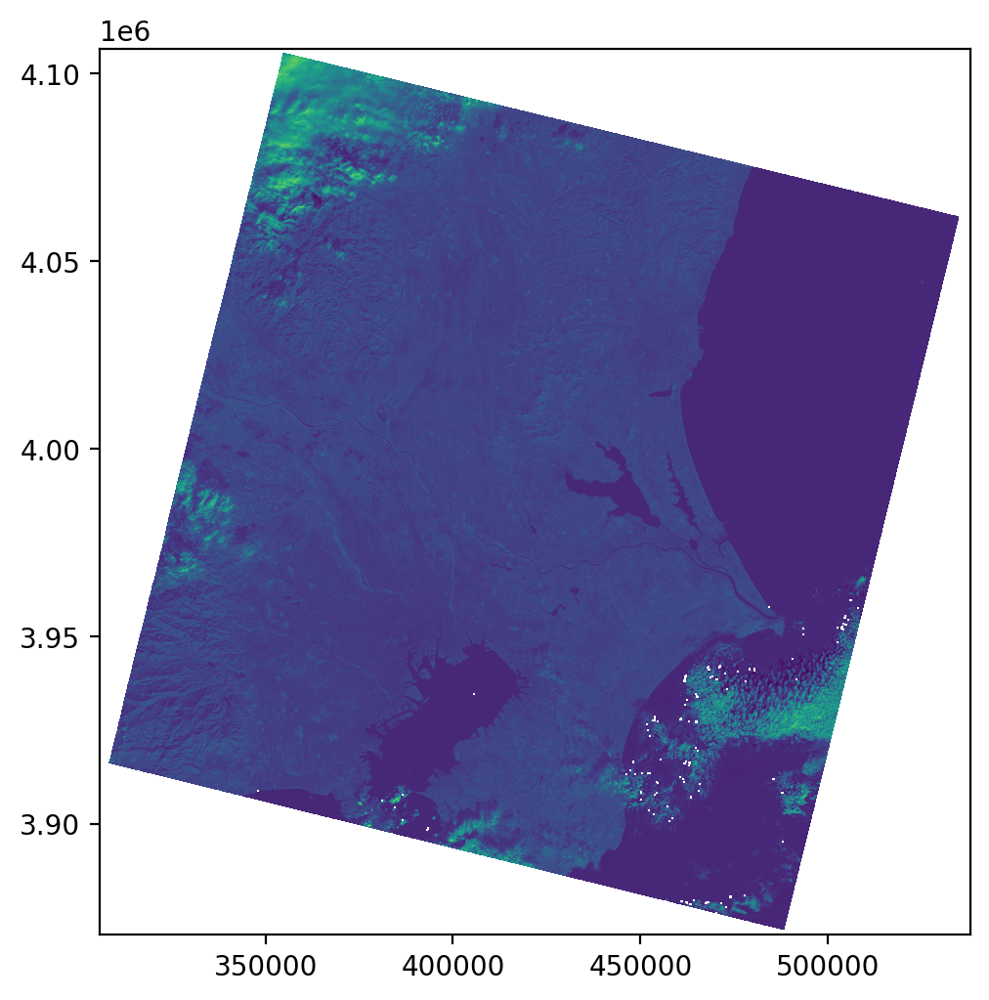

<AxesSubplot: >

In [8]:
import rasterio as rio
import rasterio.plot

b5 = rio.open(item.assets['SR_B5'].href)
rio.plot.show(b5)

ヒストグラムを確認する。

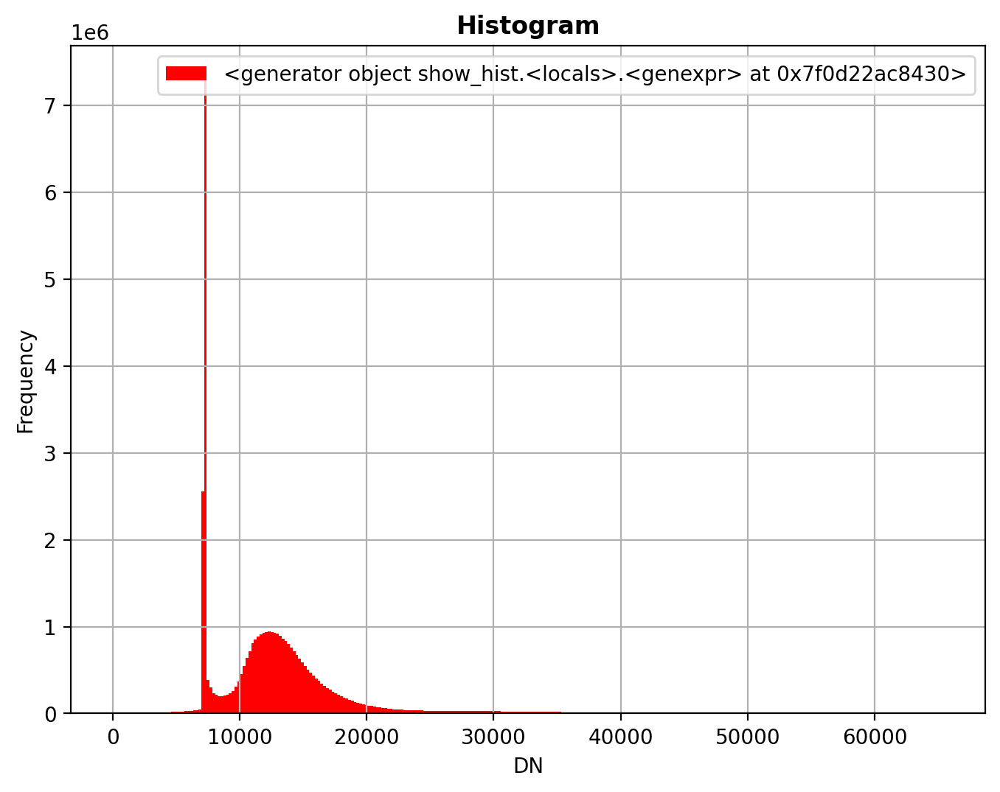

In [9]:
rio.plot.show_hist(b5, bins=300)

値のある範囲でカラーバーをつけてグレースケール表示する。

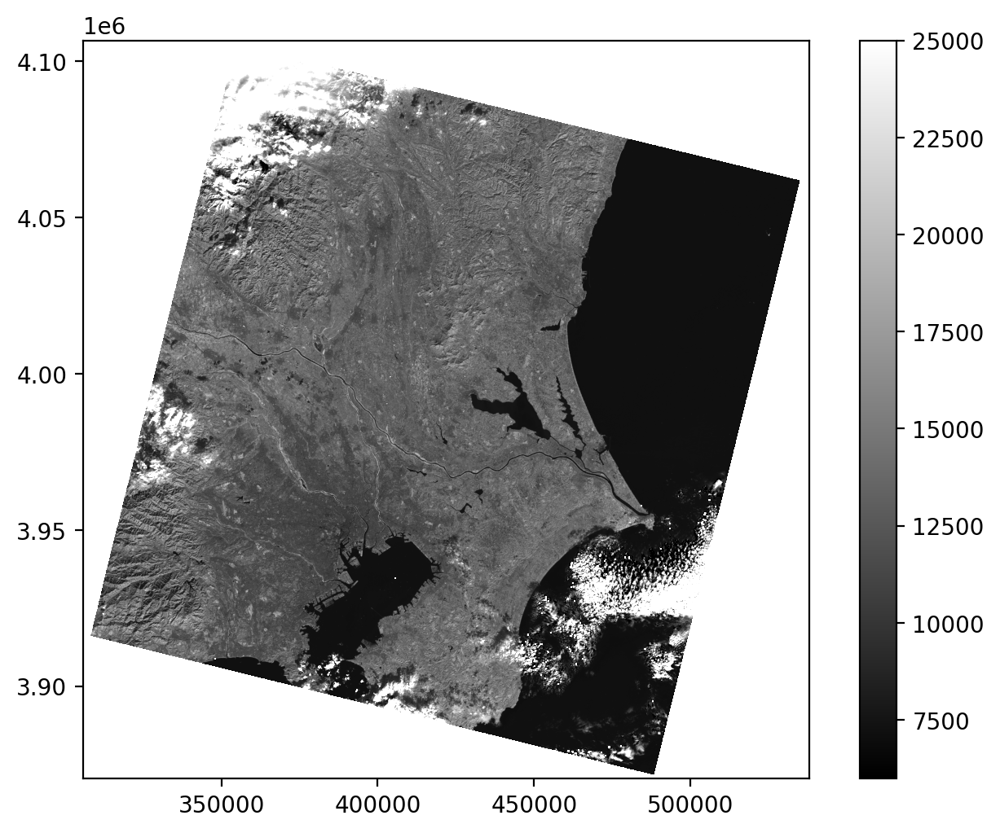

In [10]:
fig, ax = plt.subplots()
rio.plot.show(b5, ax=ax, vmin=6000, vmax=25000, cmap='gray')
fig.colorbar(ax.get_images()[0])

青（B2）、緑（B3）、赤（B4）それぞれのバンドについてもヒストグラムと画像を表示する。

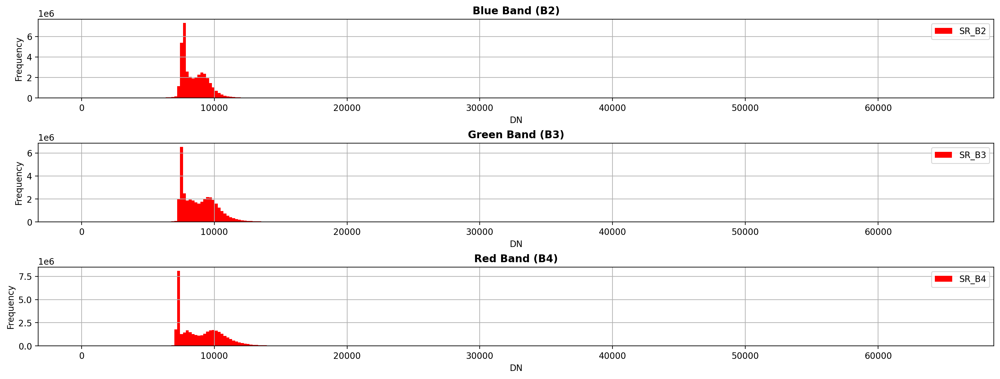

In [11]:
b2 = rio.open(item.assets['SR_B2'].href)
b3 = rio.open(item.assets['SR_B3'].href)
b4 = rio.open(item.assets['SR_B4'].href)
bands = [b2, b3, b4]

_fig, axs = plt.subplots(3, 1, figsize=(16, 6), layout='constrained')

for ax, band, key in zip(axs, bands, ['SR_B2', 'SR_B3', 'SR_B4']):
  rio.plot.show_hist(band, ax=ax, bins=300, title=item.assets[key].title, label=[key]) # The default label seems to be broken with Rasterio v1.3.4 and Matplotlib v3.6.2 

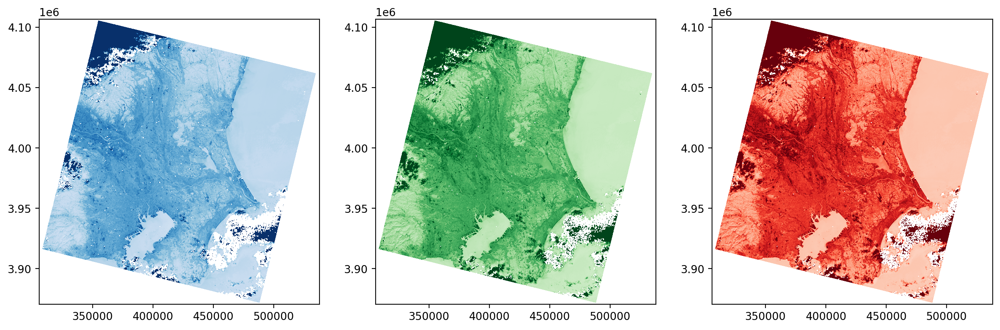

In [12]:
_fig, axs = plt.subplots(1, 3, figsize=(16, 6))

for ax, band, cmap in zip(axs, bands, ['Blues', 'Greens', 'Reds']):
  rio.plot.show(band, ax=ax, vmin=6000, vmax=12000, cmap=cmap)

## 画像の切り出し

開始位置とサイズを指定して、近赤外（B5）から皇居付近を切り出す。

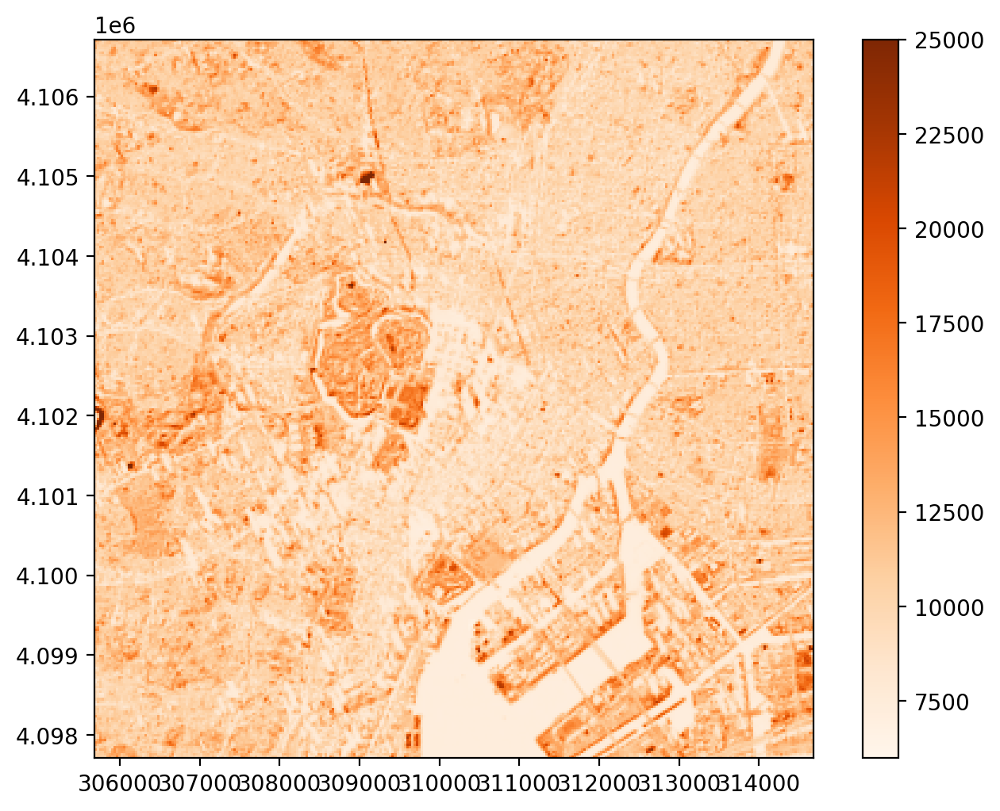

In [13]:
fig, ax = plt.subplots()
window = rio.windows.Window(2600, 5100, 300, 300) # 皇居付近
rio.plot.show(b5.read(window=window), transform=b5.transform, ax=ax, vmin=6000, vmax=25000, cmap='Oranges')
fig.colorbar(ax.get_images()[0])

赤（B4）の CRS を EPSG:4326 に変換し、国立競技場近辺を切り出す。

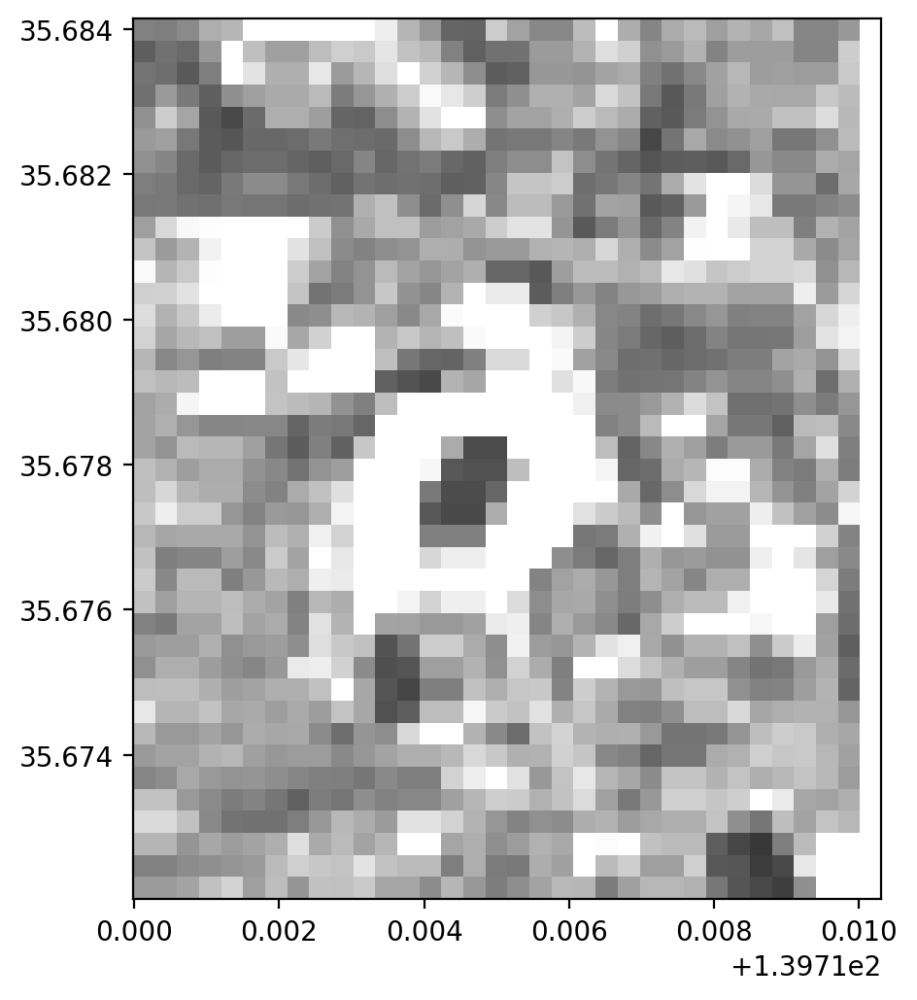

In [14]:
import rasterio.mask
import rasterio.warp
import shapely

# 国立競技場付近
polygon = shapely.Polygon([
    [139.7101, 35.6721],
    [139.7101, 35.6841],
    [139.7201, 35.6841],
    [139.7201, 35.6721],
    [139.7101, 35.6721],
])

dst_crs = 'EPSG:4326'
transform, width, height = rio.warp.calculate_default_transform(b4.crs, dst_crs, b4.width, b4.height, *b4.bounds)
reprojected_meta = {
    **b4.meta,
    'crs': dst_crs,
    'transform': transform,
    'width': width,
    'height': height
}

with rio.io.MemoryFile() as memfile:
  with memfile.open(**reprojected_meta) as dst:
    for i in range(1, b4.count + 1):
      rio.warp.reproject(
          source=rio.band(b4, i),
          destination=rio.band(dst, i),
          src_transform=b4.transform,
          src_crs=b4.crs,
          dst_transform=transform,
          dst_crs=dst_crs,
          resampling=rio.warp.Resampling.nearest
      )
  
  with memfile.open() as reprojected_b4:
    masked_image, transform = rio.mask.mask(reprojected_b4, [polygon], crop=True)
    masked_meta = {
        **reprojected_b4.meta,
        'transform': transform,
        'width': masked_image.shape[2],
        'height': masked_image.shape[1]
    }

with rio.io.MemoryFile() as memfile:
  with memfile.open(**masked_meta) as dst:
    dst.write(masked_image)
  with memfile.open() as masked_b4:
    rio.plot.show(masked_b4, vmin=6000, vmax=12000, cmap='gray')

## カラー合成

東京湾近辺のトゥルーカラー、フォルスカラー、ナチュラルカラー画像を作成する。

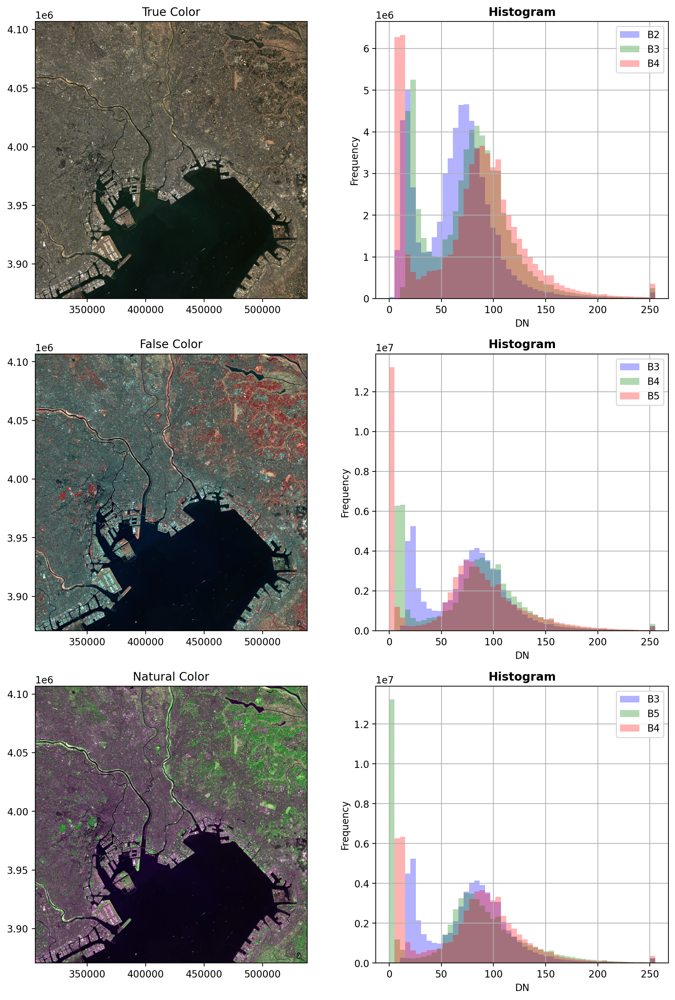

In [15]:
import numpy as np

window = rio.windows.Window(2400, 4500, 1500, 1500) # 東京湾

band_with_clip = [
    (b4, 7000, 15000),
    (b3, 7000, 15000),
    (b2, 7000, 15000),
    (b5, 7000, 20000)
]
with rio.io.MemoryFile() as memfile:
  multiband_meta = {**b2.meta, 'count': len(band_with_clip)}
  with memfile.open(**multiband_meta) as multiband:
    for i, (band, min, max) in enumerate(band_with_clip, 1):
      data = band.read(1, window=window)
      data = np.clip(data, min, max)
      data = np.subtract(data, min)
      data = np.multiply(data, 255 / (max - min)).astype('uint8')
      multiband.write(data, i)
    
  _fix, axs = plt.subplots(3, 2, figsize=(12, 18))
  title_indexes_labels = [
      ('True Color', [1, 2, 3], ['B4', 'B3', 'B2']),
      ('False Color', [4, 1, 2], ['B5', 'B4', 'B3']),
      ('Natural Color', [1, 4, 2], ['B4', 'B5', 'B3'])
  ]
  with memfile.open() as multiband:
    for (ax1, ax2), (title, indexes, labels) in zip(axs, title_indexes_labels):
      ax1.set_title(title)
      rio.plot.show(multiband.read(indexes), ax=ax1, transform=multiband.transform)
      rio.plot.show_hist(multiband.read(indexes), ax=ax2, bins=50, label=labels, histtype='stepfilled', alpha=0.3)

## パンシャープン画像の作成

Planetary Computer の landsat-8-c2-l2 コレクションにパンクロマティック（Band 8）が見当たらないため断念。